In [1]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pickle
import pymc3 as pm
import theano

In [51]:
PAIR_ELTS = ('st', 'sp', 'tw', 'th', 'li', 'ds', 'ch', 'ju')
DANCE_ELTS = ('tw', 'st', 'pd', 'li', 'l2', 'sp', 'ch')
COMP_TYPES = ('ss', 'tr', 'pe', 'co', 'in')

In [52]:
PAIR_PRIORS = (('st', 3.0), ('sp', 3.5), ('tw', 5.0), ('th', 4.0), ('li', 6.0), ('ds', 4.0), ('ch', 2.0), ('ju', 3.0))
DANCE_PRIORS = (('tw', 6.0), ('st', 7.0), ('pd', 4.0), ('li', 4.0), ('l2', 8.0), ('sp', 4.0), ('ch', 2.0))

In [80]:
PAIRS_ELEMENTS = pd.read_csv('pd_data/elements_pairs.csv')
PAIRS_ELEMENTS18 = pd.read_csv('pd_data/elements_pairs18.csv')
DANCE_ELEMENTS = pd.read_csv('pd_data/elements_dance.csv')
DANCE_ELEMENTS18 = pd.read_csv('pd_data/elements_dance18.csv')
PAIRS_COMPONENTS = pd.read_csv('pd_data/components_summary_pairs.csv')
PAIRS_COMPONENTS18 = pd.read_csv('pd_data/components_summary_pairs18.csv')
DANCE_COMPONENTS = pd.read_csv('pd_data/components_summary_dance.csv')
DANCE_COMPONENTS18 = pd.read_csv('pd_data/components_summary_dance18.csv')

In [54]:
PRIORS = DANCE_PRIORS

In [9]:
def plot_trace(trace, label):
    pm.traceplot(trace)
    plt.show()

    estimates = pd.Series(trace['mu_' + label].mean(axis=0), index=skaters)
    se = pd.Series(trace['mu_' + label].std(axis=0), index=skaters)

    order = estimates.sort_values().index
    plt.scatter(xrange(len(estimates)), estimates[order])
    for i, m, s in zip(range(len(estimates)), estimates[order], se[order]):
        plt.plot([i,i], [m-s, m+s], 'b-')
    plt.ylabel(label + ' Points'); plt.xlabel('Ordered Skater');
    plt.show()

In [50]:
elements = pd.read_csv('pd_data/elements_dance.csv')
skaters = sorted(elements.skater.unique())
num_skaters = len(skaters)
skater_lookup = dict(zip(skaters, xrange(len(skaters))))

elements18 = pd.read_csv('pd_data/elements_dance18.csv')
elements18['skater_code'] = elements18.apply(lambda row: skater_lookup.get(row.skater, -1), axis=1)

In [51]:
results = {}  # dict of (trace, model, shared_vars)

/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 1000/1000 [00:10<00:00, 90.99it/s]


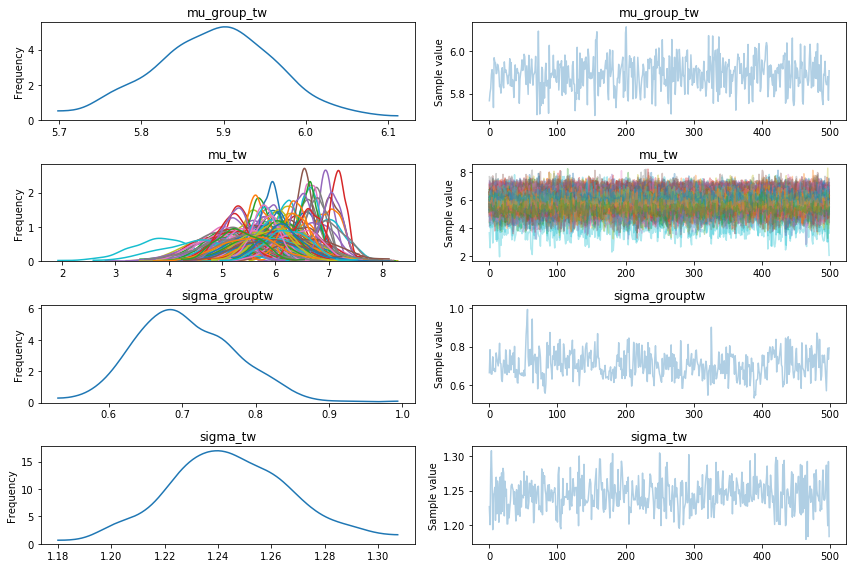

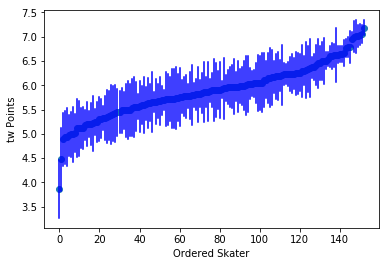

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 1000/1000 [00:08<00:00, 114.76it/s]


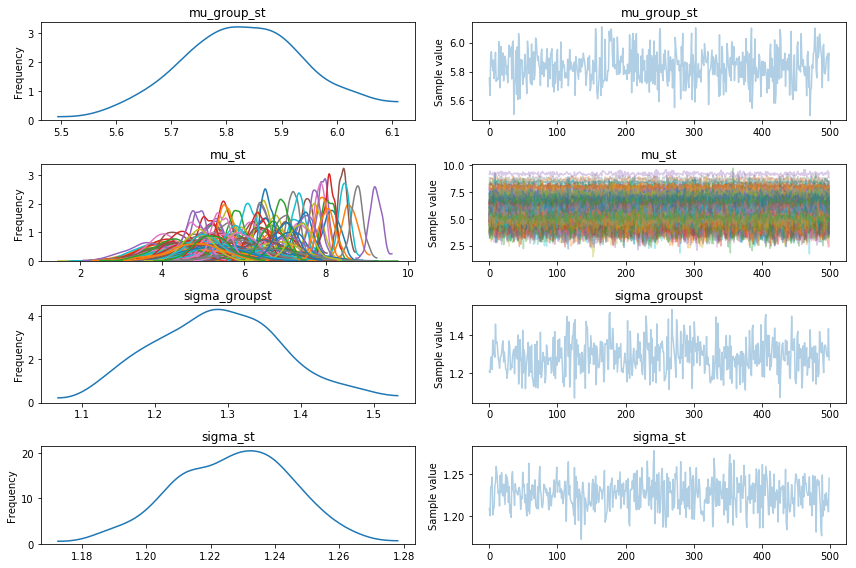

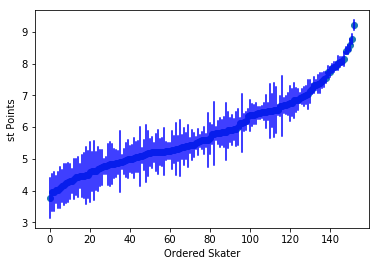

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 1000/1000 [00:08<00:00, 119.72it/s]


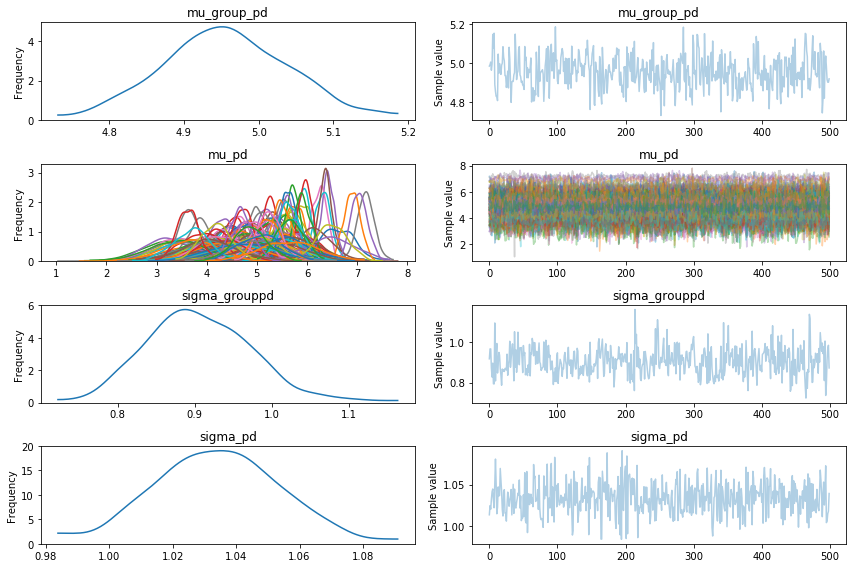

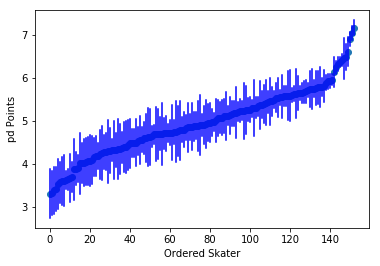

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 1000/1000 [00:12<00:00, 78.19it/s]


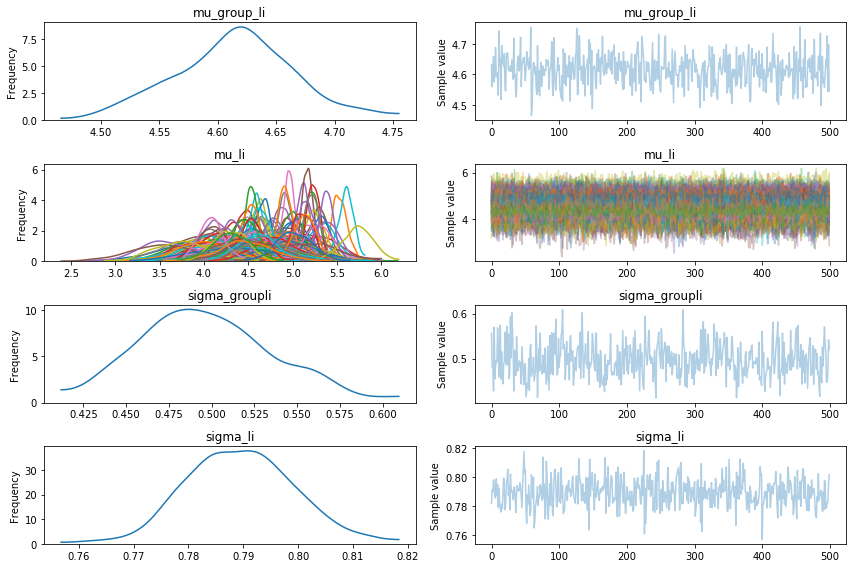

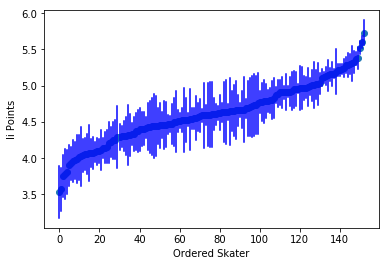

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 1000/1000 [00:08<00:00, 120.30it/s]


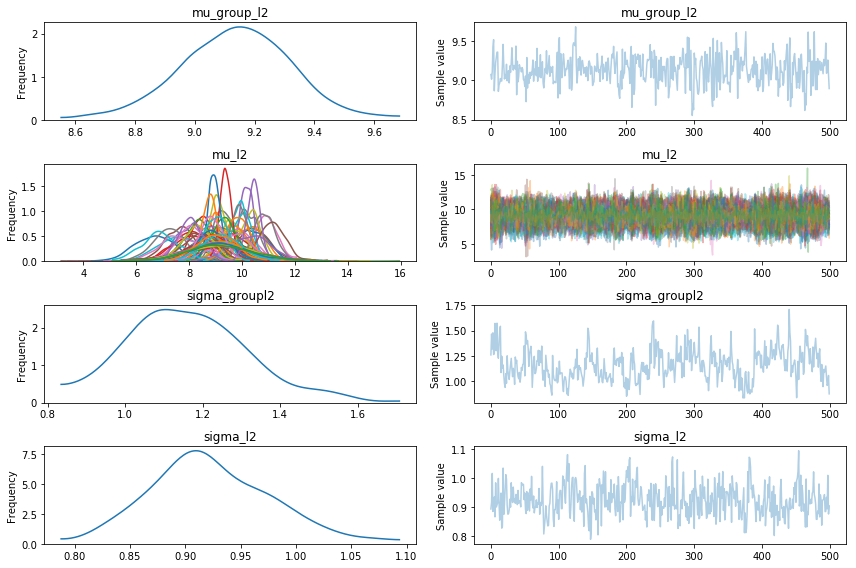

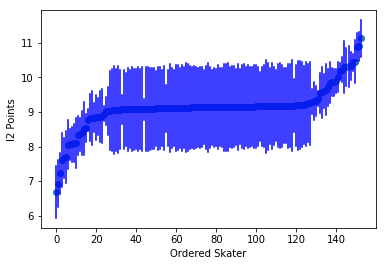

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 1000/1000 [00:08<00:00, 124.15it/s]


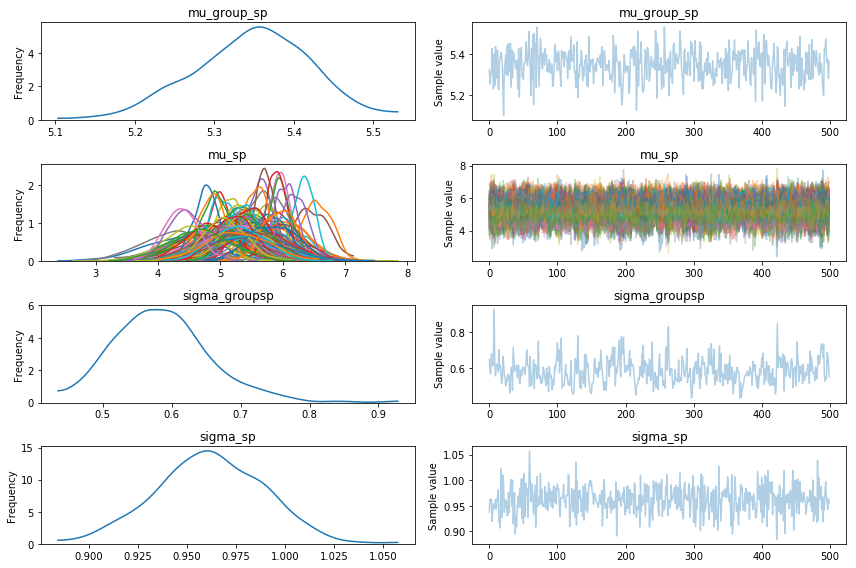

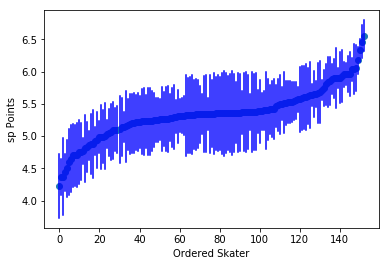

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 1000/1000 [00:08<00:00, 123.83it/s]


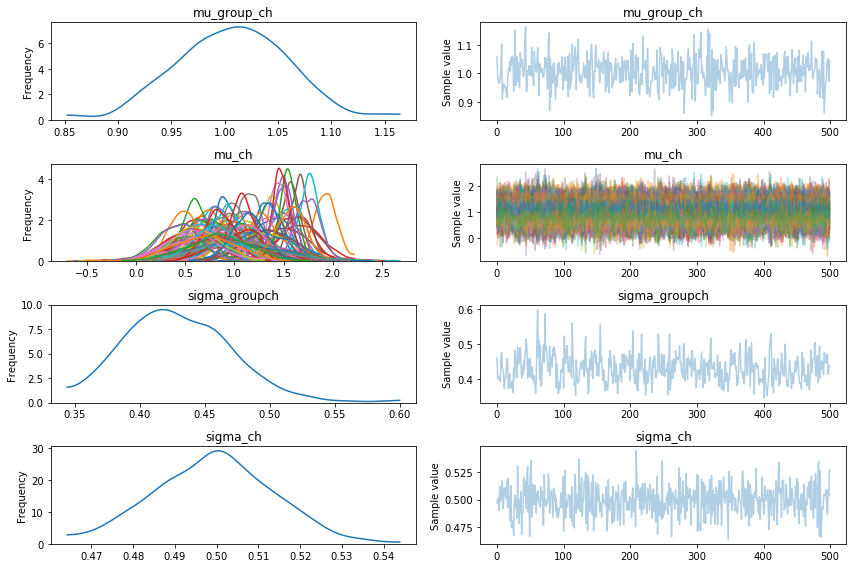

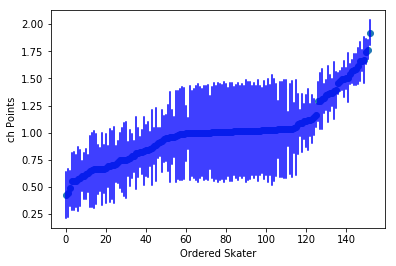

In [55]:
for elt_type, prior_mu in PRIORS:
    elts = elements[elements.elt_type == elt_type]
    skater = elts['skater_code'] = elts.skater.replace(skater_lookup).values
    skater = theano.shared(skater)
    points = elts.points
    
    model = pm.Model()
    with model:
        mu_g = pm.Normal('mu_group_' + elt_type, prior_mu, sd=1e5)
        sigma_g = pm.HalfCauchy('sigma_group' + elt_type, 5)
        
        mu = pm.Normal('mu_' + elt_type, mu=mu_g, sd=sigma_g, shape=num_skaters)
        sigma = pm.HalfCauchy('sigma_' + elt_type, 5)
        y = pm.Normal('y_' + elt_type, mu[skater], sd=sigma, observed=points)

    with model:
        trace = pm.sample()

    results[elt_type] = (trace, model, skater)
    plot_trace(trace, elt_type)

In [56]:
components = pd.read_csv('pd_data/components_summary_dance.csv')
skaters = sorted(components.skater.unique())
num_skaters = len(skaters)
skater_lookup = dict(zip(skaters, xrange(len(skaters))))

components18 = pd.read_csv('pd_data/components_summary_dance18.csv')
components18['skater_code'] = components18.apply(lambda row: skater_lookup.get(row.skater, -1), axis=1)

/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 1000/1000 [00:08<00:00, 111.96it/s]


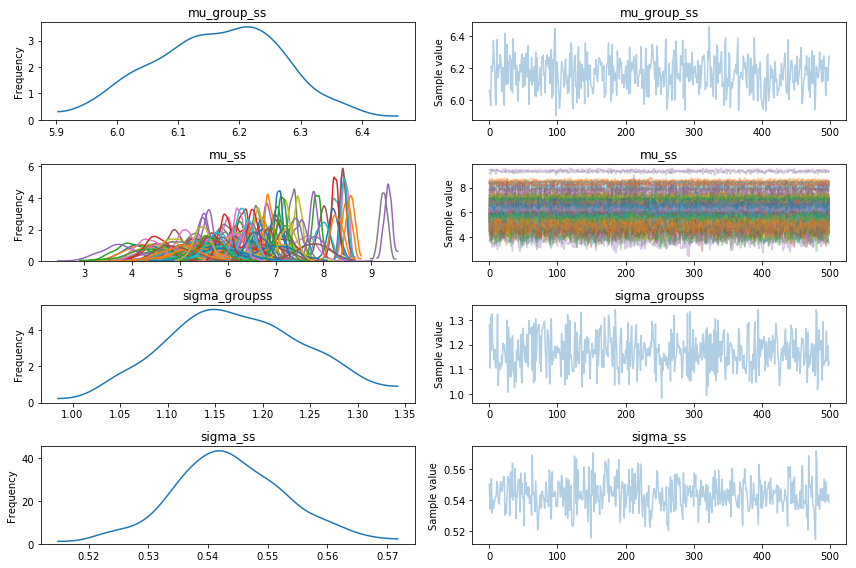

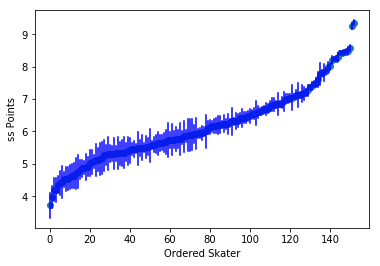

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 1000/1000 [00:06<00:00, 151.09it/s]


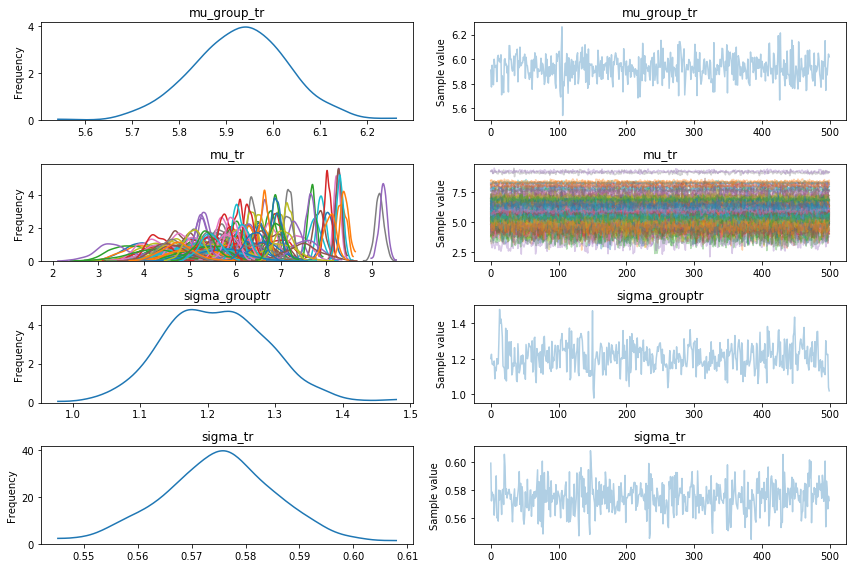

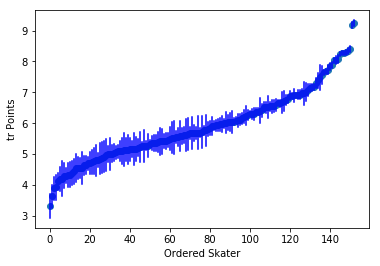

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 1000/1000 [00:06<00:00, 154.31it/s]


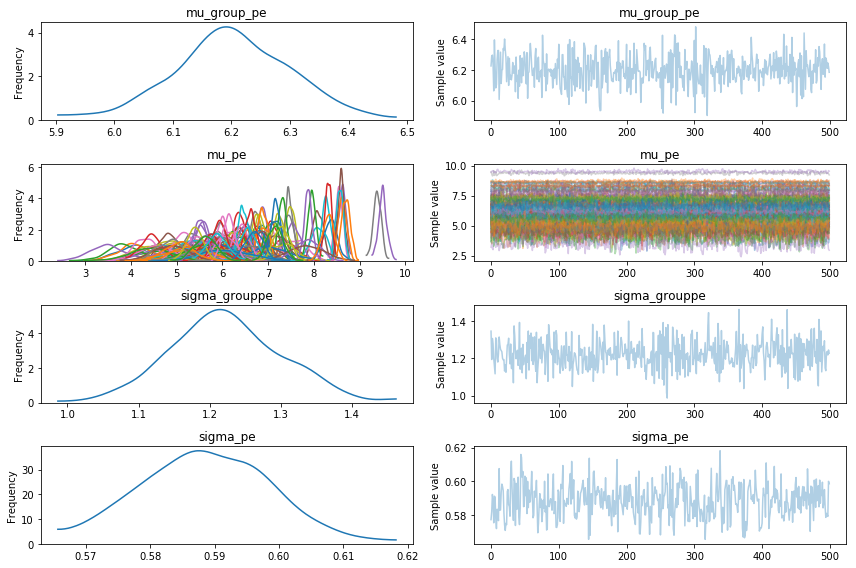

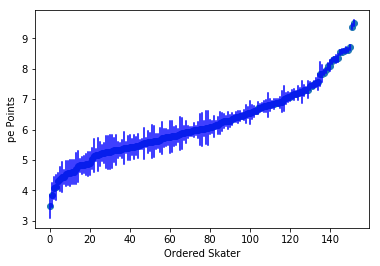

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 1000/1000 [00:07<00:00, 141.94it/s]


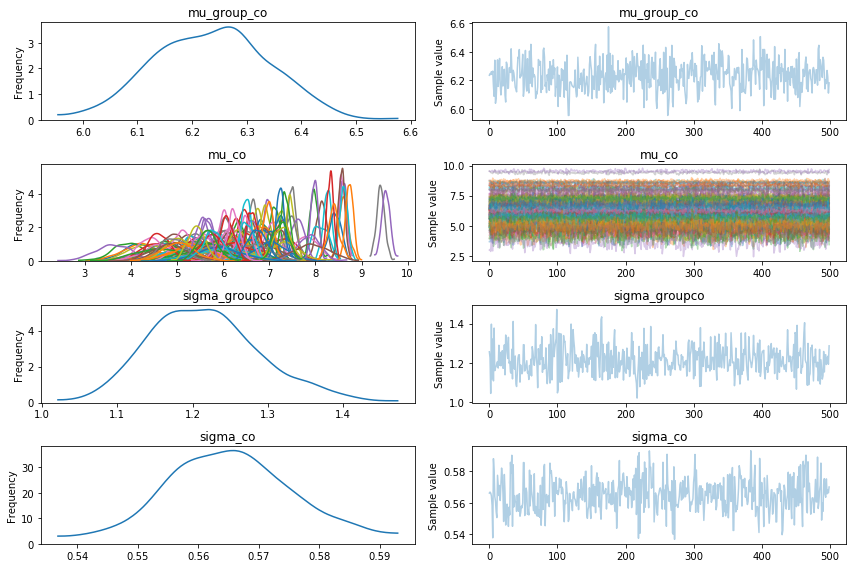

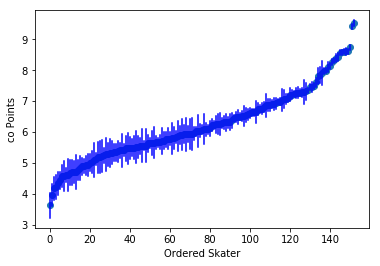

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 1000/1000 [00:07<00:00, 141.98it/s]


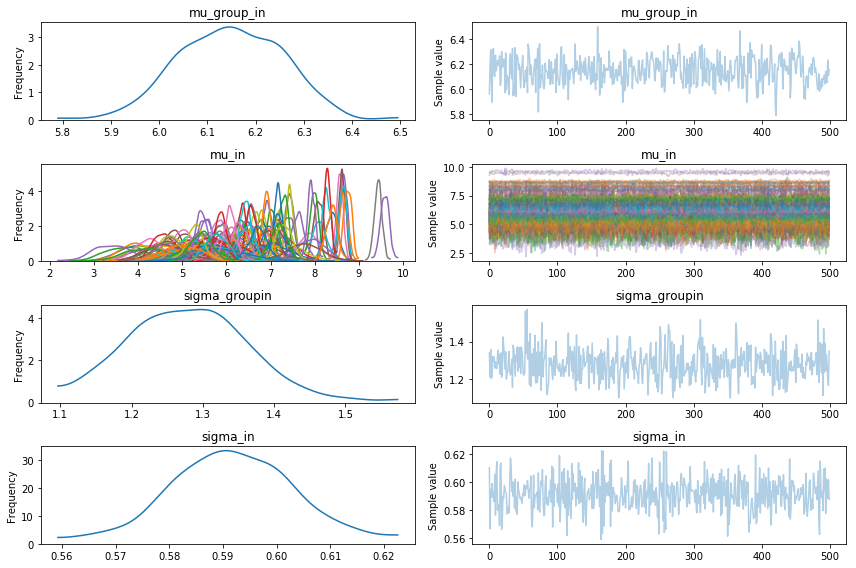

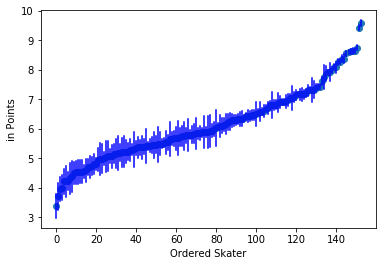

In [57]:
for comp_type in COMP_TYPES:
    comps = components[components.comp_type == comp_type]
    skater = comps['skater_code'] = comps.skater.replace(skater_lookup).values
    skater = theano.shared(skater)
    points = comps.points
    
    model = pm.Model()

    with model:
        mu_g = pm.Normal('mu_group_' + comp_type, 7.0, sd=1e5)
        sigma_g = pm.HalfCauchy('sigma_group' + comp_type, 5)
        
        mu = pm.Normal('mu_' + comp_type, mu=mu_g, sd=sigma_g, shape=num_skaters)
        sigma = pm.HalfCauchy('sigma_' + comp_type, 5)
        y = pm.Normal('y_' + comp_type, mu[skater], sd=sigma, observed=points)

    with model:
        trace = pm.sample()
    
    results[comp_type] = (trace, model, skater)
    plot_trace(trace, comp_type)

In [58]:
# Make predictions.
ppc = {}

In [59]:
for elt_type in DANCE_ELTS:
    trace, model, skater_var = results[elt_type]
    skater_var.set_value(
        np.asarray(elements18[elements18.elt_type == elt_type].skater_code)
    )
    ppc[elt_type] = pm.sample_ppc(trace, model=model, samples=500)['y_' + elt_type]

100%|██████████| 500/500 [00:00<00:00, 2189.64it/s]


In [60]:
for comp_type in COMP_TYPES:
    trace, model, skater_var = results[comp_type]
    skater_var.set_value(
        np.asarray(components18[components18.comp_type == comp_type].skater_code)
    )
    ppc[comp_type] = pm.sample_ppc(trace, model=model, samples=500)['y_' + comp_type]

100%|██████████| 500/500 [00:00<00:00, 1868.13it/s]


In [61]:
means = {}

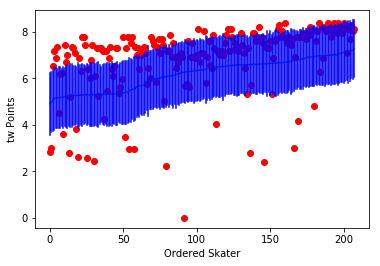

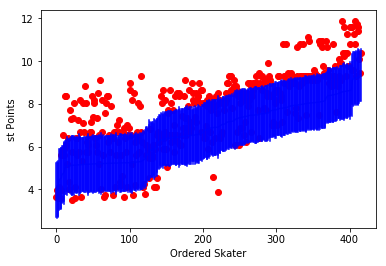

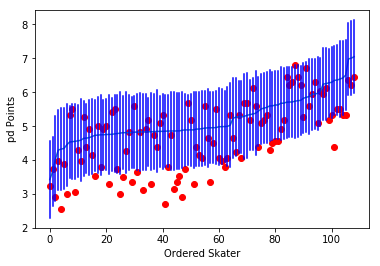

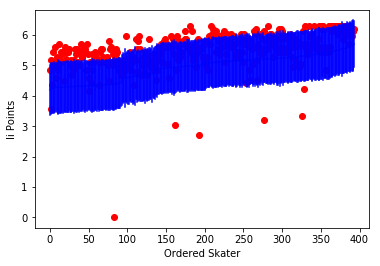

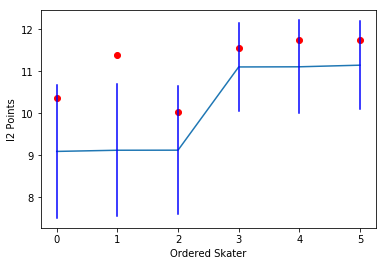

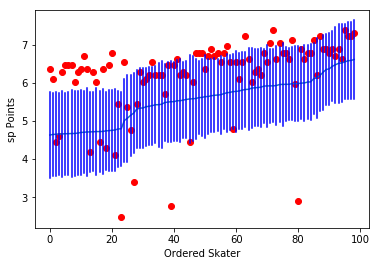

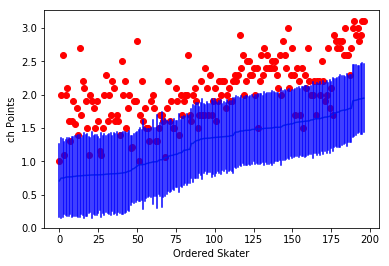

In [62]:
for elt_type in DANCE_ELTS:
    mean = ppc[elt_type].mean(axis=0)
    means[elt_type] = mean
    std = np.std(ppc[elt_type], axis=0)
    elts18type = elements18[elements18.elt_type == elt_type]
    order = pd.Series(mean).sort_values().index
    outcomes = []
    for index in order:
        outcomes.append(elts18type.iloc[index].points)
    plt.scatter(xrange(len(mean)), outcomes, color='r')
    plt.plot(xrange(len(mean)), [mean[x] for x in order])
    for i, m, s in zip(xrange(len(mean)), mean[order], std[order]):
        plt.plot([i,i], [m-s, m+s], 'b-')
    plt.ylabel(elt_type + ' Points');plt.xlabel('Ordered Skater');
    plt.show()

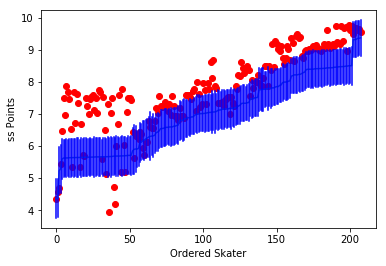

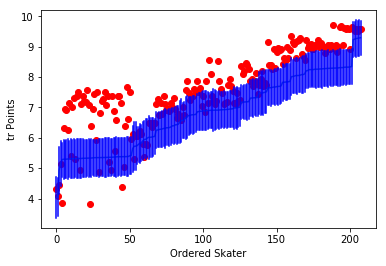

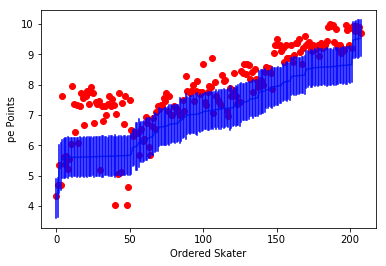

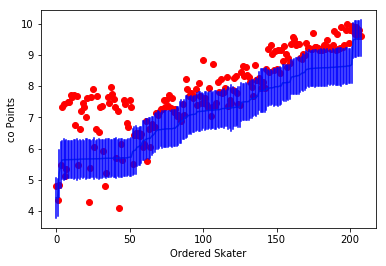

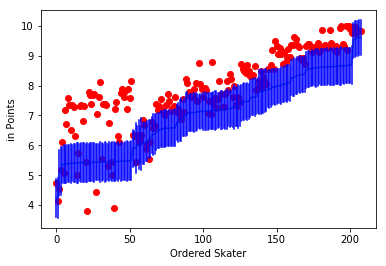

In [63]:
for comp_type in COMP_TYPES:
    mean = ppc[comp_type].mean(axis=0)
    means[comp_type] = mean
    std = np.std(ppc[comp_type], axis=0)
    comp18type = components18[components18.comp_type == comp_type]
    order = pd.Series(mean).sort_values().index
    outcomes = []
    for index in order:
        outcomes.append(comp18type.iloc[index].points)
    plt.scatter(xrange(len(mean)), outcomes, color='r')
    plt.plot(xrange(len(mean)), [mean[x] for x in order])
    for i, m, s in zip(xrange(len(mean)), mean[order], std[order]):
        plt.plot([i,i], [m-s, m+s], 'b-')
    plt.ylabel(comp_type + ' Points');plt.xlabel('Ordered Skater');
    plt.show()

In [64]:
elt_pred_col = []
elt_indices = {elt_type: 0 for elt_type in DANCE_ELTS}
for index, row in elements18.iterrows():
    elt_pred_col.append(means[row.elt_type][elt_indices[row.elt_type]])
    elt_indices[row.elt_type] += 1

In [65]:
comp_indices = {comp_type: 0 for comp_type in COMP_TYPES}
comp_pred_col = []
for index, row in components18.iterrows():
    comp_pred_col.append(means[row.comp_type][comp_indices[row.comp_type]])
    comp_indices[row.comp_type] += 1

In [66]:
elements18['prediction'] = elt_pred_col
components18['prediction'] = comp_pred_col

In [67]:
components18.rename(columns={'comp_type': 'elt_type'}, inplace=True)
elements18['is_elt'] = pd.Series([1] * len(elt_pred_col))
components18['is_elt'] = pd.Series([0] * len(comp_pred_col))

In [68]:
prediction = pd.concat([elements18, components18])

In [69]:
prediction.to_csv('fits/dance_predictions1.csv')

In [4]:
###############
### MODEL 2 ###
###############

In [61]:
PAIR_PRIORS = (('st', 3.0, 0.5), ('sp', 3.5, 0.5), ('tw', 5.0, 1.0), ('th', 4.0, 1.0),
               ('li', 6.0, 0.7), ('ds', 4.0, 0.5), ('ch', 2.0, 0.5), ('ju', 3.0, 1.0))
DANCE_PRIORS = (('tw', 6.0, 1.0), ('st', 7.0, 1.0), ('pd', 4.0, 0.5), ('li', 4.0, 0.5), 
                ('l2', 8.0, 0.5), ('sp', 4.0, 0.5), ('ch', 2.0, 0.5))

In [81]:
PRIORS = PAIR_PRIORS
ELTS = PAIR_ELTS
ELEMENTS = PAIRS_ELEMENTS
ELEMENTS18 = PAIRS_ELEMENTS18
COMPONENTS = PAIRS_COMPONENTS
COMPONENTS18 = PAIRS_COMPONENTS18

In [82]:
elements = ELEMENTS
skaters = sorted(elements.skater.unique())
num_skaters = len(skaters)
skater_lookup = dict(zip(skaters, xrange(len(skaters))))

elements18 = ELEMENTS18
elements18['skater_code'] = elements18.apply(lambda row: skater_lookup.get(row.skater, -1), axis=1)

In [83]:
results = {}  # dict of (trace, model, shared_vars)

/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 1000/1000 [00:15<00:00, 66.14it/s]


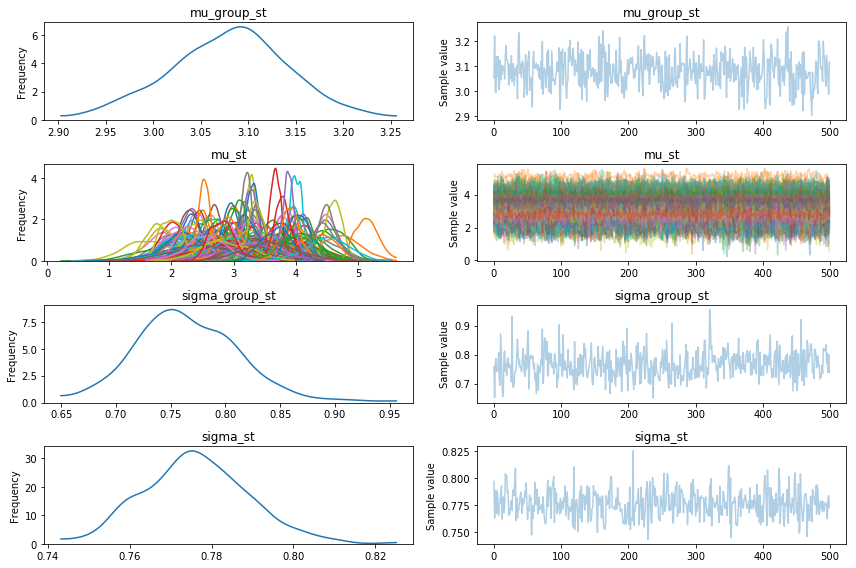

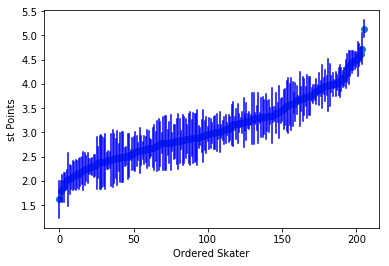

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 1000/1000 [00:16<00:00, 59.70it/s]


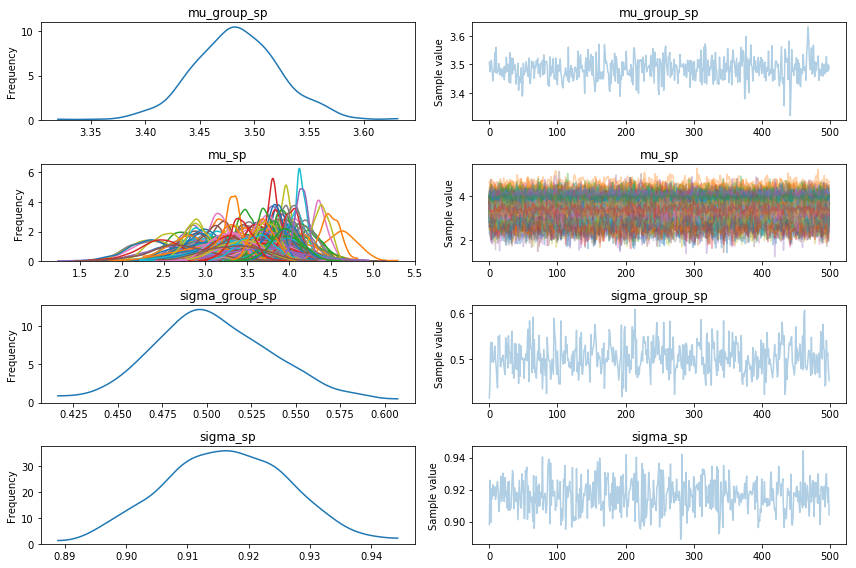

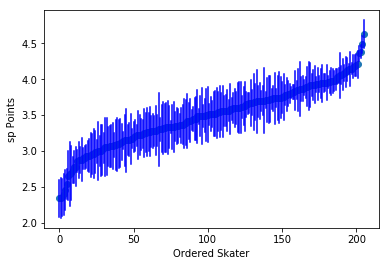

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 1000/1000 [00:35<00:00, 28.03it/s]


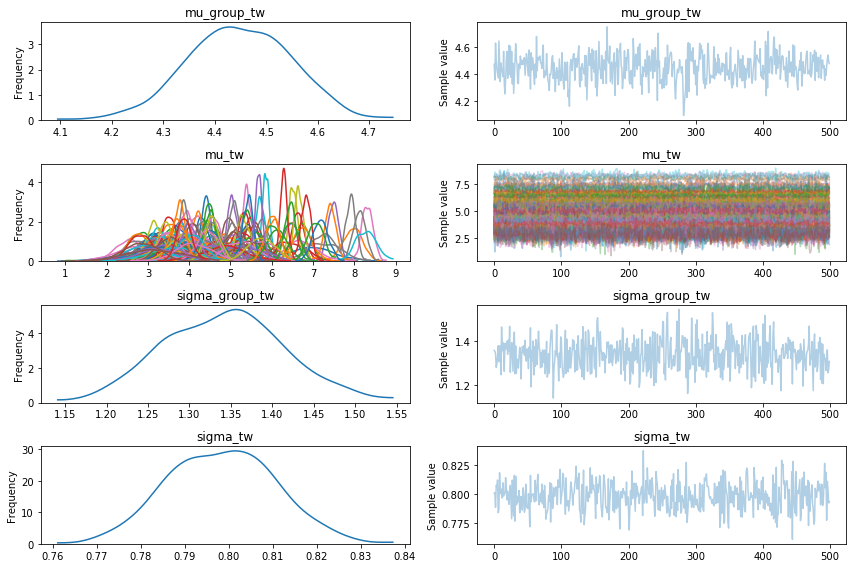

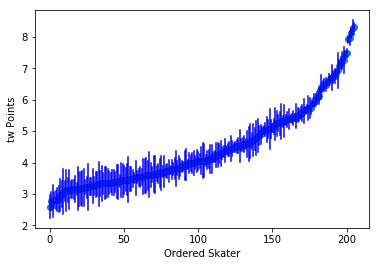

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 1000/1000 [00:39<00:00, 25.07it/s]


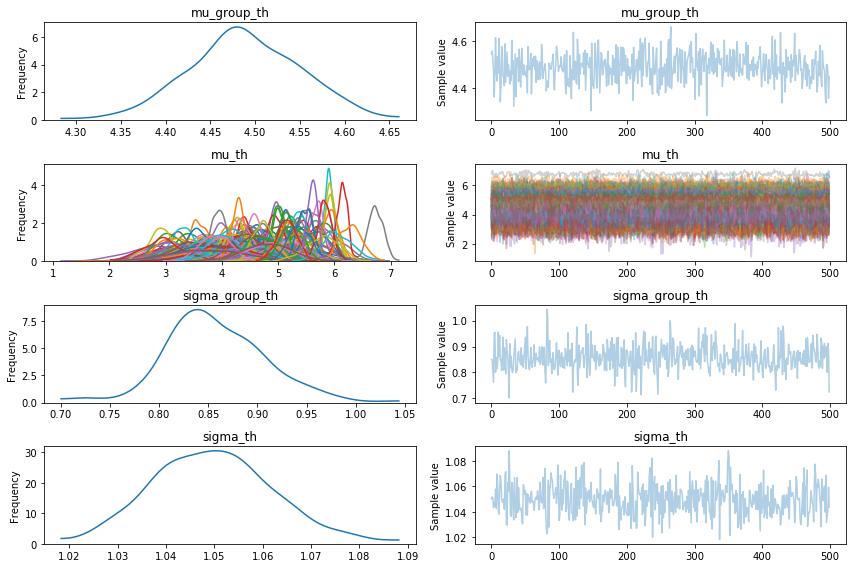

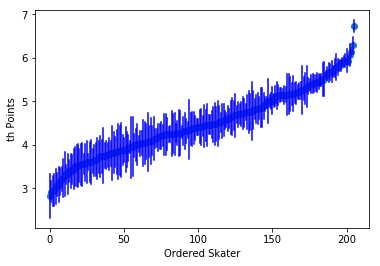

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 1000/1000 [00:12<00:00, 82.74it/s]


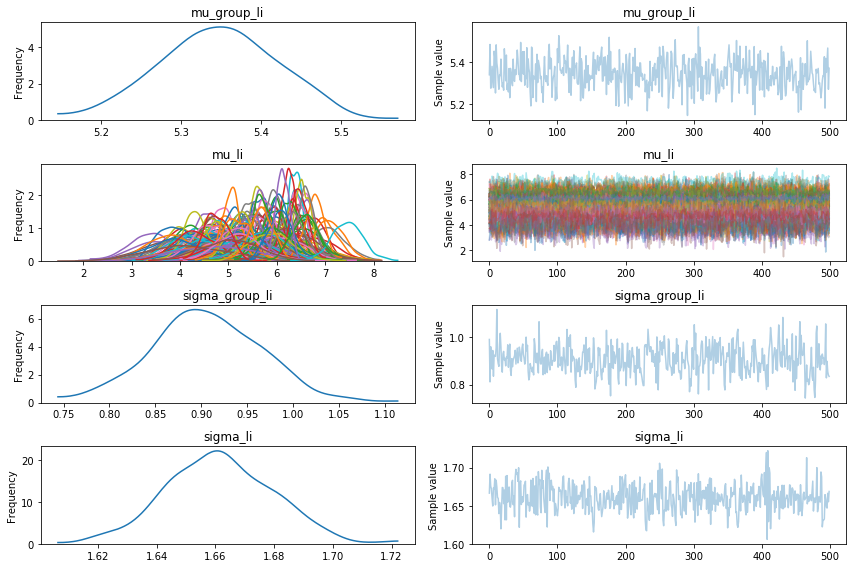

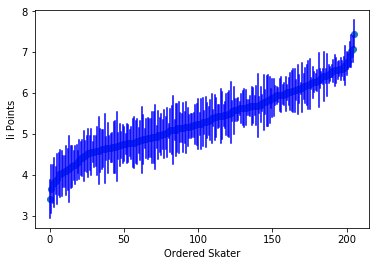

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 1000/1000 [00:13<00:00, 74.76it/s]


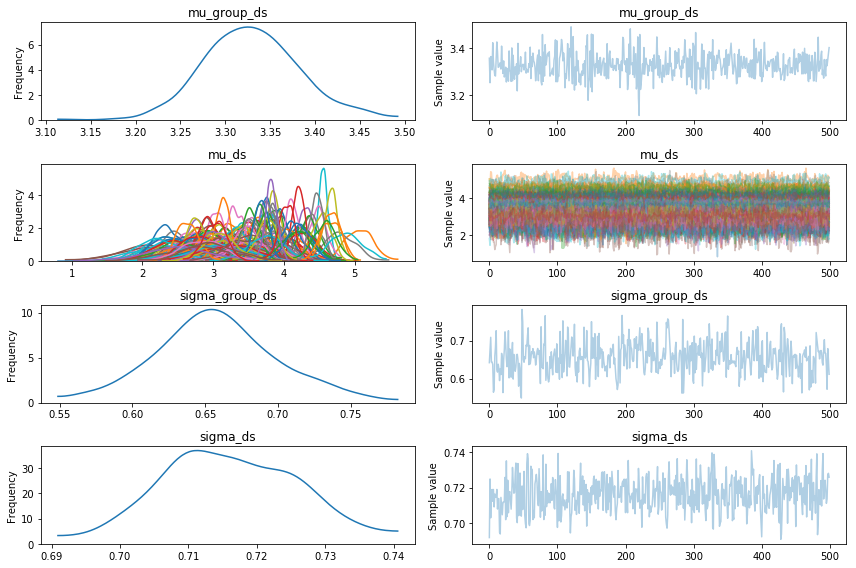

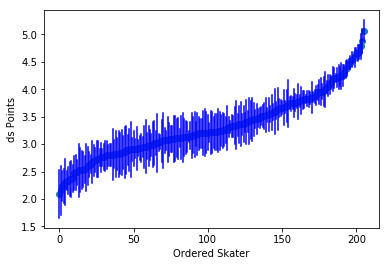

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 1000/1000 [00:05<00:00, 175.39it/s]


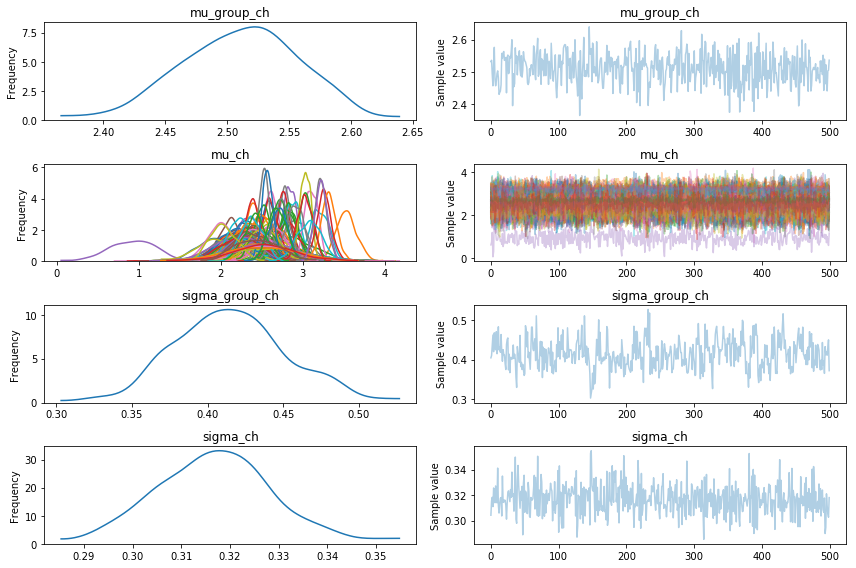

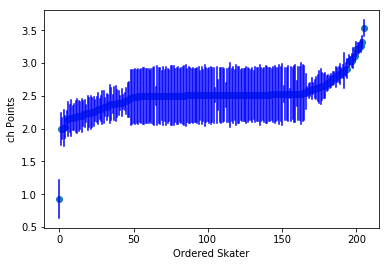

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 1000/1000 [00:10<00:00, 95.67it/s]


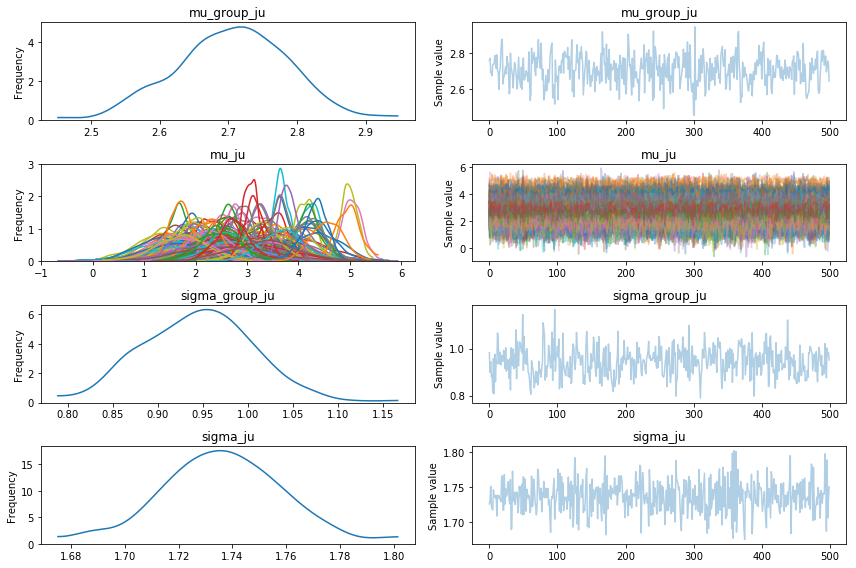

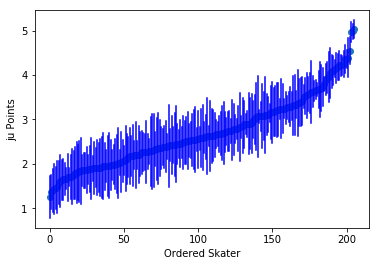

In [84]:
for elt_type, prior_mu, prior_sd in PRIORS:
    elts = elements[elements.elt_type == elt_type]
    skater = elts['skater_code'] = elts.skater.replace(skater_lookup).values
    skater = theano.shared(skater)
    points = elts.points
    
    model = pm.Model()
    with model:
        # Prior on group distribution.
        mu_g = pm.Normal('mu_group_' + elt_type, prior_mu, sd=prior_sd)
        sigma_g = pm.HalfCauchy('sigma_group_' + elt_type, 5)
        
        # Group distribution.
        mu = pm.Normal('mu_' + elt_type, mu=mu_g, sd=sigma_g, shape=num_skaters)
        sigma = pm.HalfCauchy('sigma_' + elt_type, 5)
        
        # Data model.
        y = pm.Normal('y_' + elt_type, mu[skater], sd=sigma, observed=points)

    # Fit the model.
    with model:
        trace = pm.sample()
        
    # Save the results.
    results[elt_type] = (trace, model, skater)
    
    # Visualize fit.
    plot_trace(trace, elt_type)

In [85]:
components = COMPONENTS
components18 = COMPONENTS18

In [86]:
# comps_history[comp_type][skater] is max historical components score for skater
comps_history = {comp_type: {} for comp_type in COMP_TYPES}

In [87]:
for skater in components.skater.unique():
    skater_comps = components[components.skater == skater]
    for comp_type in COMP_TYPES:
        comps_history[comp_type][skater] = skater_comps[skater_comps.comp_type == comp_type].points.max()

In [88]:
med_comp = {comp_type: np.median(comps_history[comp_type].values()) for comp_type in COMP_TYPES}

In [89]:
# Make predictions.
ppc = {}

In [90]:
for elt_type in ELTS:
    trace, model, skater_var = results[elt_type]
    skater_var.set_value(
        np.asarray(elements18[elements18.elt_type == elt_type].skater_code)
    )
    ppc[elt_type] = pm.sample_ppc(trace, model=model, samples=500)['y_' + elt_type]

100%|██████████| 500/500 [00:00<00:00, 1246.42it/s]


In [91]:
comp_pred_col = []
for index, row in components18.iterrows():
    comp_pred_col.append(comps_history[row.comp_type].get(row.skater, med_comp[row.comp_type]))

In [92]:
means = {}

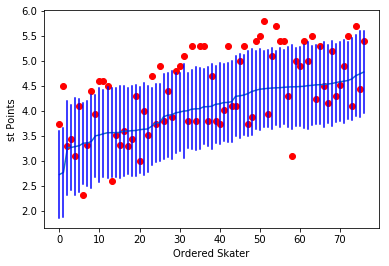

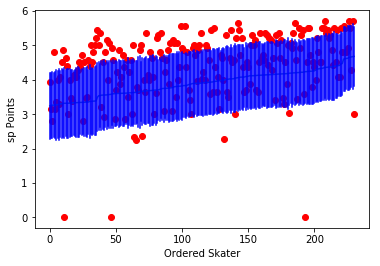

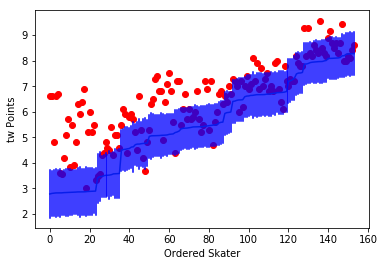

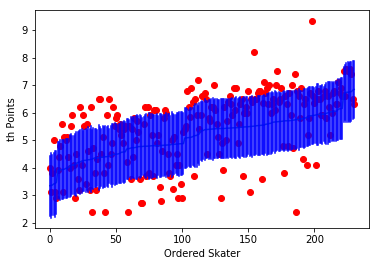

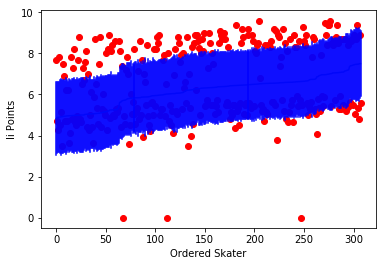

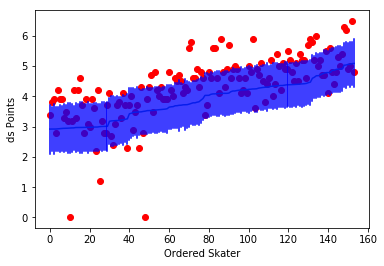

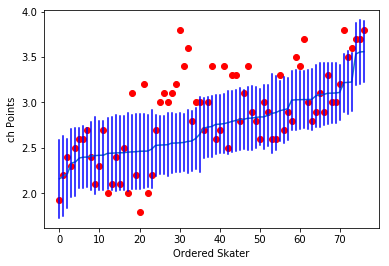

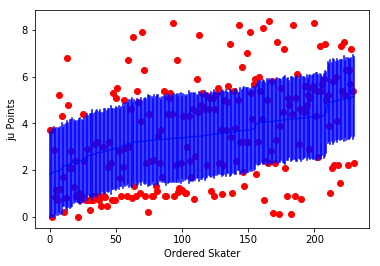

In [93]:
for elt_type in ELTS:
    mean = ppc[elt_type].mean(axis=0)
    means[elt_type] = mean
    std = np.std(ppc[elt_type], axis=0)
    elts18type = elements18[elements18.elt_type == elt_type]
    order = pd.Series(mean).sort_values().index
    outcomes = []
    for index in order:
        outcomes.append(elts18type.iloc[index].points)
    plt.scatter(xrange(len(mean)), outcomes, color='r')
    plt.plot(xrange(len(mean)), [mean[x] for x in order])
    for i, m, s in zip(xrange(len(mean)), mean[order], std[order]):
        plt.plot([i,i], [m-s, m+s], 'b-')
    plt.ylabel(elt_type + ' Points');plt.xlabel('Ordered Skater');
    plt.show()

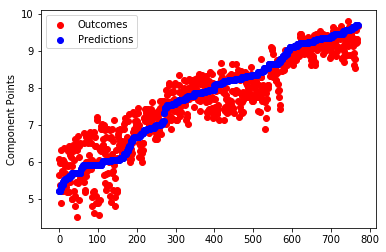

In [94]:
order = pd.Series(comp_pred_col).sort_values().index
outcomes = []
for index in order:
    outcomes.append(components18.iloc[index].points)
plt.scatter(xrange(len(outcomes)), outcomes, color='r', label='Outcomes')
plt.scatter(xrange(len(comp_pred_col)), sorted(comp_pred_col), color='b', label='Predictions')
plt.ylabel('Component Points')
plt.legend(loc='best')

In [95]:
elt_pred_col = []
elt_indices = {elt_type: 0 for elt_type in ELTS}
for index, row in elements18.iterrows():
    elt_pred_col.append(means[row.elt_type][elt_indices[row.elt_type]])
    elt_indices[row.elt_type] += 1

In [97]:
elements18['prediction'] = elt_pred_col
components18['prediction'] = comp_pred_col
components18.rename(columns={'comp_type': 'elt_type'}, inplace=True)
elements18['is_elt'] = pd.Series([1] * len(elt_pred_col))
components18['is_elt'] = pd.Series([0] * len(comp_pred_col))

In [98]:
prediction = pd.concat([elements18, components18])
prediction.to_csv('fits/pairs_predictions2.csv')

In [ ]:
###############
### MODEL 3 ###
###############

In [124]:
PRIORS = DANCE_PRIORS
ELTS = DANCE_ELTS
ELEMENTS = DANCE_ELEMENTS
ELEMENTS18 = DANCE_ELEMENTS18
COMPONENTS = DANCE_COMPONENTS
COMPONENTS18 = DANCE_COMPONENTS18

In [125]:
elements = ELEMENTS
components = COMPONENTS
elements.date = elements.date.astype('datetime64[ns]')
components.date = components.date.astype('datetime64[ns]')

In [126]:
skater_start = {}
for skater in elements.skater.unique():
    skater_elts = elements[elements.skater == skater]
    skater_start[skater] = skater_elts.date.unique()[0]

In [127]:
elements['weeks_since_skater_start'] = elements.apply(lambda row: row.date - skater_start[row.skater], axis=1).astype('timedelta64[W]')
components['weeks_since_skater_start'] = components.apply(lambda row: row.date - skater_start[row.skater], axis=1).astype('timedelta64[W]')

overall_start = elements.date.unique()[0]
elements['weeks_since_overall_start'] = elements.apply(lambda row: row.date - overall_start, axis=1).astype('timedelta64[W]')
components['weeks_since_overall_start'] = components.apply(lambda row: row.date - overall_start, axis=1).astype('timedelta64[W]')

elements['log_skater_start'] = elements.apply(lambda row: -1 if row.weeks_since_skater_start == 0
                                                          else np.log(row.weeks_since_skater_start), axis=1)
elements['log_overall_start'] = elements.apply(lambda row: -1 if row.weeks_since_overall_start == 0
                                                           else np.log(row.weeks_since_overall_start), axis=1)
components['log_skater_start'] = components.apply(lambda row: -1 if row.weeks_since_skater_start == 0
                                                                 else np.log(row.weeks_since_skater_start), axis=1)
components['log_overall_start'] = elements.apply(lambda row: -1 if row.weeks_since_overall_start == 0
                                                             else np.log(row.weeks_since_overall_start), axis=1)

In [128]:
skaters = sorted(elements.skater.unique())
num_skaters = len(skaters)
skater_lookup = dict(zip(skaters, xrange(len(skaters))))

In [129]:
elements18 = ELEMENTS18
components18 = COMPONENTS18

elements18.date = elements18.date.astype('datetime64[ns]')
components18.date = components18.date.astype('datetime64[ns]')

In [130]:
elements18['skater_code'] = elements18.apply(lambda row: skater_lookup.get(row.skater, -1), axis=1)
components18['skater_code'] = components18.apply(lambda row: skater_lookup.get(row.skater, -1), axis=1)

In [131]:
# Update skater_start for new data.
for skater in elements18.skater.unique():
    if skater in skater_start:
        continue
    skater_elts = elements18[elements18.skater == skater]
    skater_start[skater] = skater_elts.date.unique()[0]

In [132]:
elements18['weeks_since_skater_start'] = elements18.apply(lambda row: row.date - skater_start[row.skater], axis=1).astype('timedelta64[W]')
components18['weeks_since_skater_start'] = components18.apply(lambda row: row.date - skater_start[row.skater], axis=1).astype('timedelta64[W]')
elements18['weeks_since_overall_start'] = elements18.apply(lambda row: row.date - overall_start, axis=1).astype('timedelta64[W]')
components18['weeks_since_overall_start'] = components18.apply(lambda row: row.date - overall_start, axis=1).astype('timedelta64[W]')
elements18['log_skater_start'] = elements18.apply(
    lambda row: -1 if row.weeks_since_skater_start == 0 else np.log(row.weeks_since_skater_start), axis=1)
elements18['log_overall_start'] = elements18.apply(
    lambda row: -1 if row.weeks_since_overall_start == 0 else np.log(row.weeks_since_overall_start), axis=1)
components18['log_skater_start'] = components18.apply(
    lambda row: -1 if row.weeks_since_skater_start == 0 else np.log(row.weeks_since_skater_start), axis=1)
components18['log_overall_start'] = elements18.apply(
    lambda row: -1 if row.weeks_since_overall_start == 0 else np.log(row.weeks_since_overall_start), axis=1)

/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
 99%|█████████▉| 1488/1500 [00:24<00:00, 60.96it/s]/anaconda/lib/python2.7/site-packages/pymc3/step_methods/hmc/nuts.py:451: UserWarning: The acceptance probability in chain 0 does not match the target. It is 0.66376904178, but should be close to 0.8. Try to increase the number of tuning steps.
  % (self._chain_id, mean_accept, target_accept))
/anaconda/lib/python2.7/site-packages/pymc3/step_methods/hmc/nuts.py:467: UserWarning: Chain 0 contains 187 diverging samples after tuning. If increasing `target_accept` does not help try to reparameterize.
  % (self._chain_id, n_diverging))
10

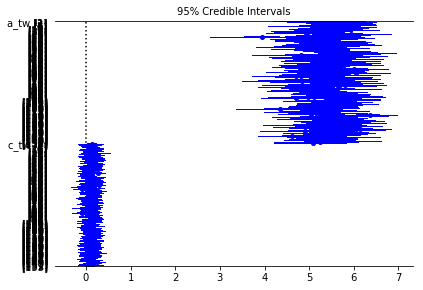

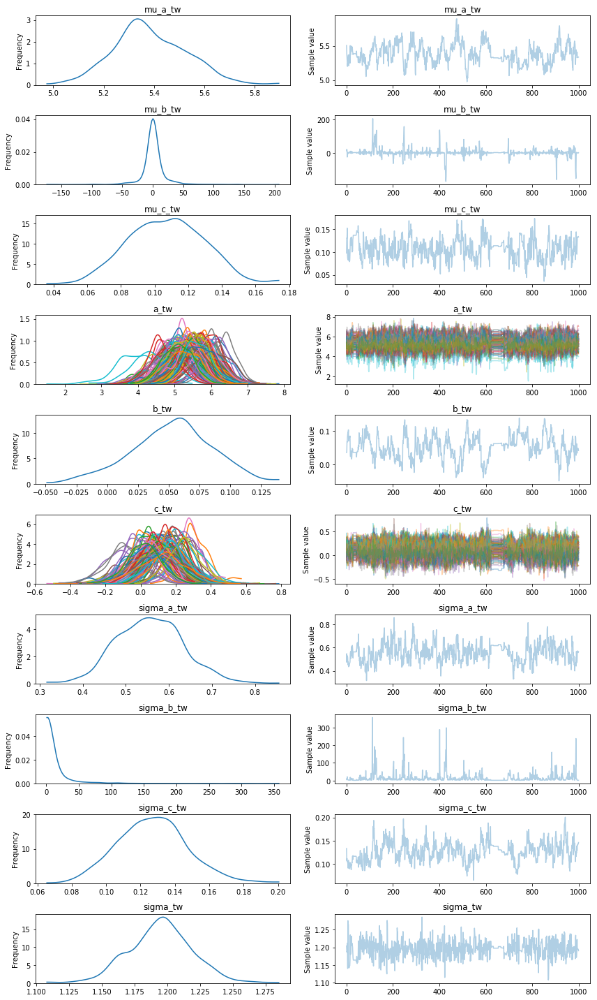

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|█████████▉| 1494/1500 [00:29<00:00, 51.29it/s]/anaconda/lib/python2.7/site-packages/pymc3/step_methods/hmc/nuts.py:467: UserWarning: Chain 0 contains 21 diverging samples after tuning. If increasing `target_accept` does not help try to reparameterize.
  % (self._chain_id, n_diverging))
100%|██████████| 1500/1500 [00:29<00:00, 51.36it/s]


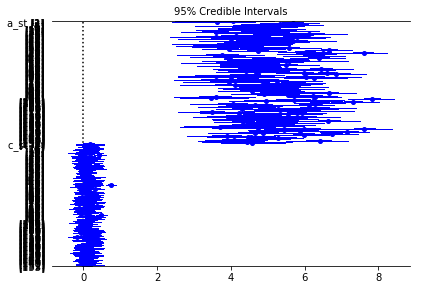

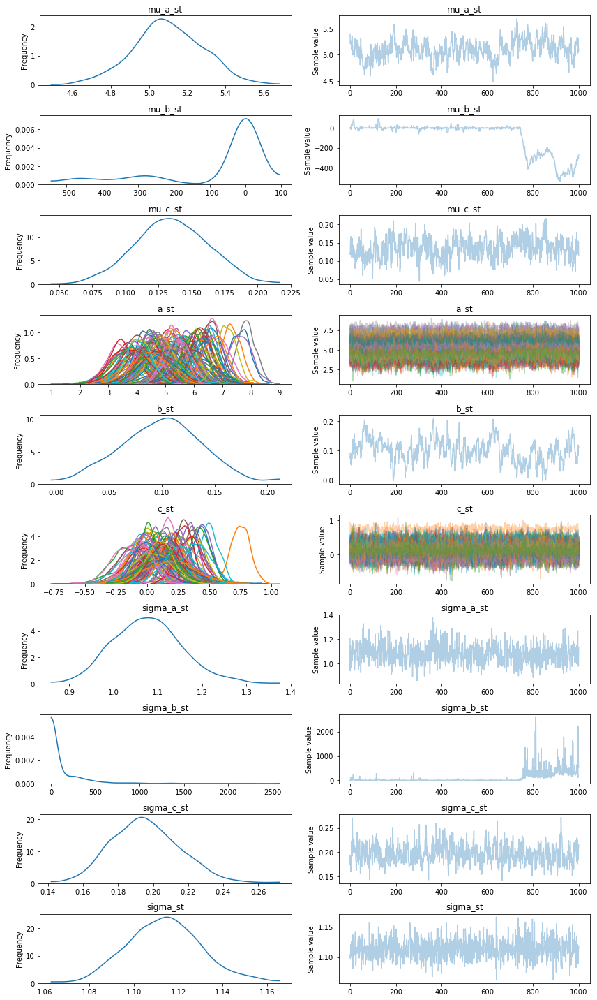

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|█████████▉| 1493/1500 [00:19<00:00, 75.15it/s]/anaconda/lib/python2.7/site-packages/pymc3/step_methods/hmc/nuts.py:467: UserWarning: Chain 0 contains 59 diverging samples after tuning. If increasing `target_accept` does not help try to reparameterize.
  % (self._chain_id, n_diverging))
100%|██████████| 1500/1500 [00:19<00:00, 75.24it/s]


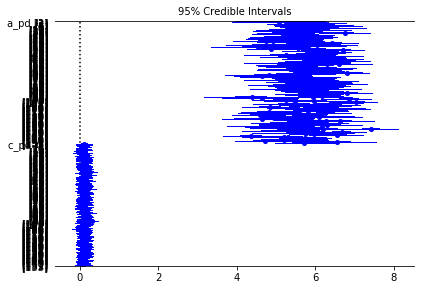

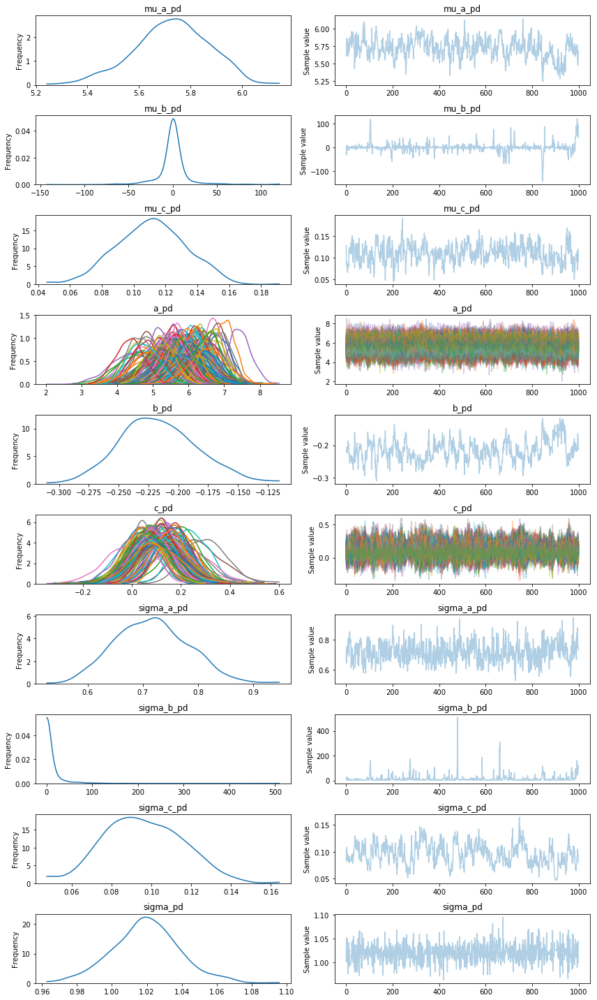

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|█████████▉| 1499/1500 [00:28<00:00, 53.46it/s]/anaconda/lib/python2.7/site-packages/pymc3/step_methods/hmc/nuts.py:467: UserWarning: Chain 0 contains 40 diverging samples after tuning. If increasing `target_accept` does not help try to reparameterize.
  % (self._chain_id, n_diverging))
100%|██████████| 1500/1500 [00:28<00:00, 53.47it/s]


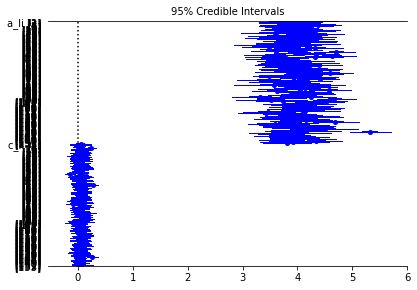

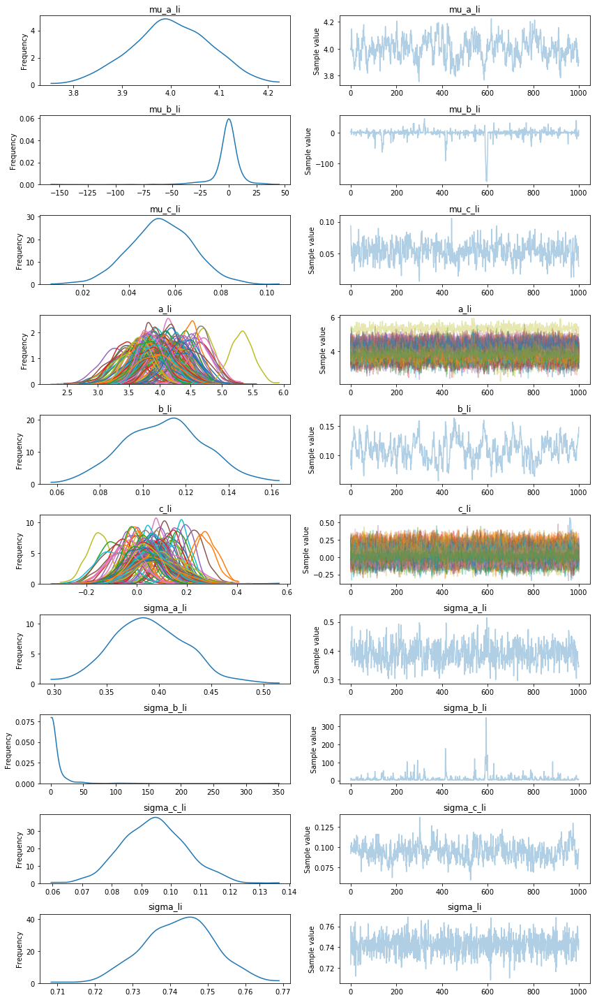

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|█████████▉| 1499/1500 [00:15<00:00, 97.20it/s]/anaconda/lib/python2.7/site-packages/pymc3/step_methods/hmc/nuts.py:467: UserWarning: Chain 0 contains 72 diverging samples after tuning. If increasing `target_accept` does not help try to reparameterize.
  % (self._chain_id, n_diverging))
100%|██████████| 1500/1500 [00:15<00:00, 97.15it/s]


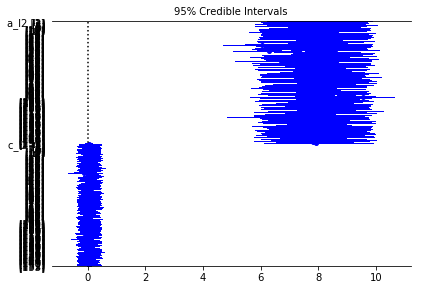

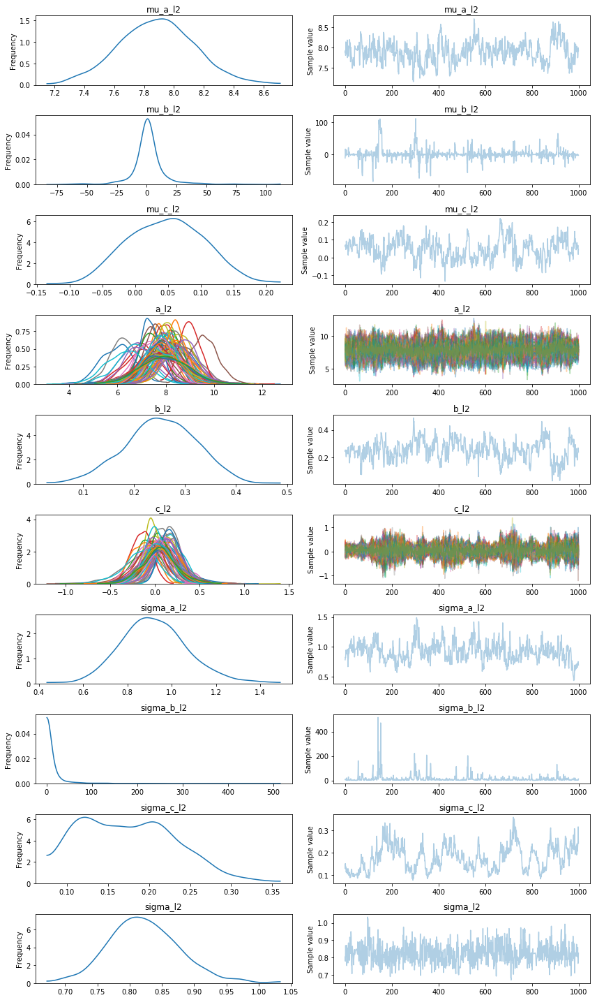

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
 99%|█████████▉| 1491/1500 [00:21<00:00, 68.04it/s]/anaconda/lib/python2.7/site-packages/pymc3/step_methods/hmc/nuts.py:467: UserWarning: Chain 0 contains 69 diverging samples after tuning. If increasing `target_accept` does not help try to reparameterize.
  % (self._chain_id, n_diverging))
100%|██████████| 1500/1500 [00:22<00:00, 68.02it/s]


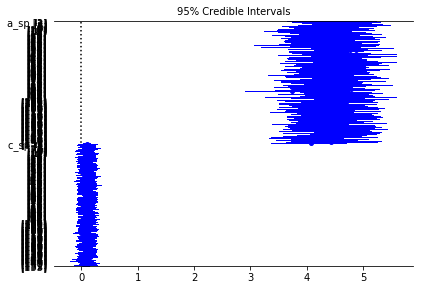

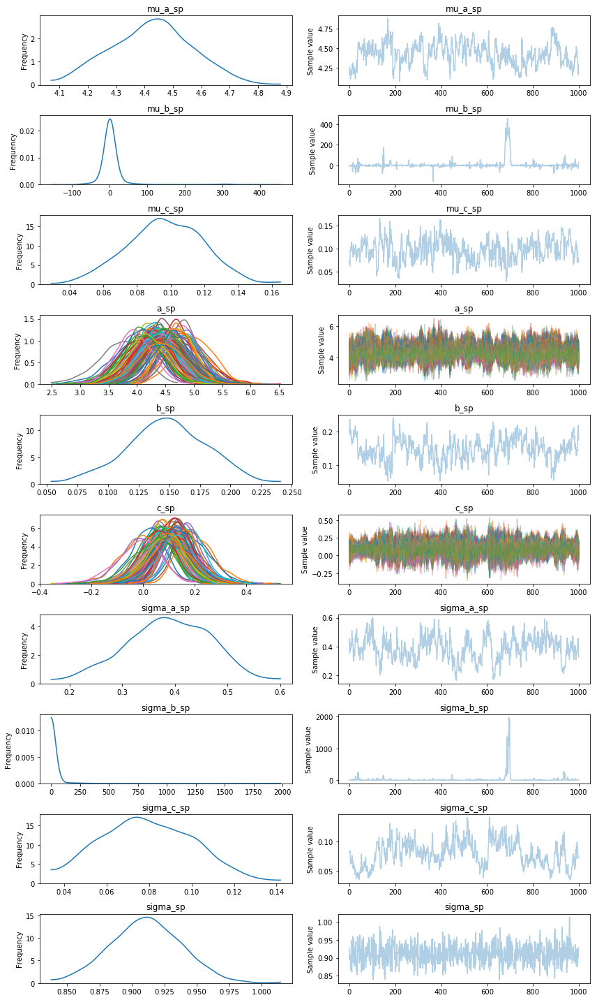

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|█████████▉| 1497/1500 [00:35<00:00, 42.58it/s]/anaconda/lib/python2.7/site-packages/pymc3/step_methods/hmc/nuts.py:467: UserWarning: Chain 0 contains 115 diverging samples after tuning. If increasing `target_accept` does not help try to reparameterize.
  % (self._chain_id, n_diverging))
100%|██████████| 1500/1500 [00:35<00:00, 42.60it/s]


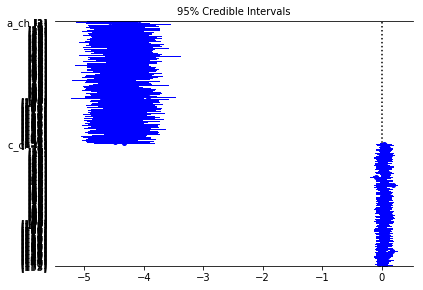

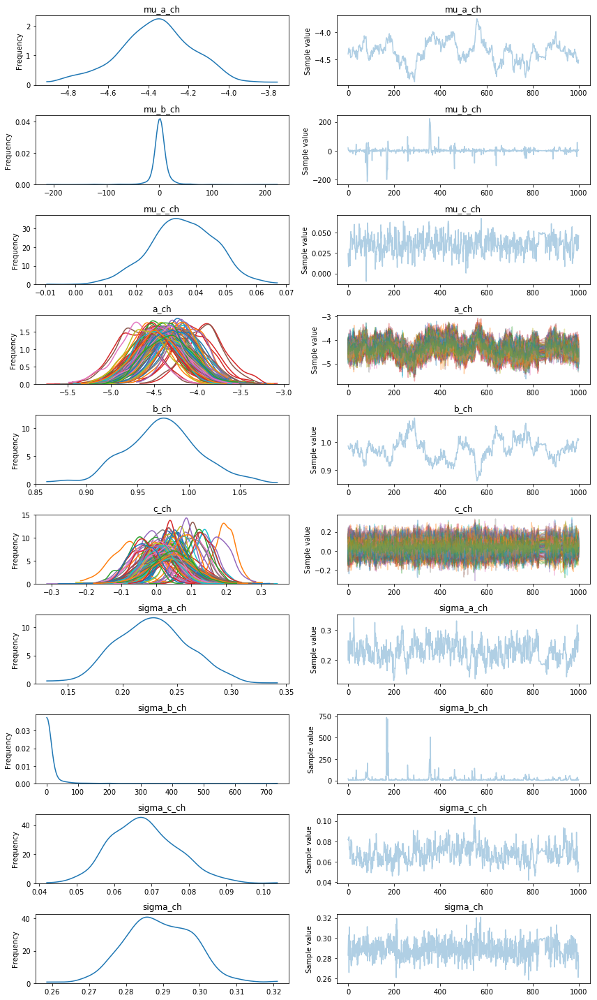

In [133]:
for elt_type, prior_mu, prior_sd in PRIORS:
    elts = elements[elements.elt_type == elt_type]

    # Predictors/group indicators.
    skater = elts['skater_code'] = elts.skater.replace(skater_lookup).values
    skater = theano.shared(skater)
    start_overall = np.asarray(elts.log_overall_start)
    start_overall = theano.shared(start_overall)
    start_skater = np.asarray(elts.log_skater_start)
    start_skater = theano.shared(start_skater)
    
    points = elts.points
    
    model = pm.Model()
    with model:
        # Prior on group distribution.
        mu_a = pm.Normal('mu_a_' + elt_type, prior_mu, sd=prior_sd)
        sigma_a = pm.HalfCauchy('sigma_a_' + elt_type, 5)
        mu_b = pm.Normal('mu_b_' + elt_type, mu=0., sd=1e5)
        sigma_b = pm.HalfCauchy('sigma_b_' + elt_type, 5)
        mu_c = pm.Normal('mu_c_' + elt_type, mu=0., sd=1e5)
        sigma_c = pm.HalfCauchy('sigma_c_' + elt_type, 5)
        
        # Group distribution.
        a = pm.Normal('a_' + elt_type, mu_a, sd=sigma_a, shape=num_skaters)
        b = pm.Normal('b_' + elt_type, mu_b, sd=sigma_b)
        c = pm.Normal('c_' + elt_type, mu_c, sd=sigma_c, shape=num_skaters)
        sigma = pm.HalfCauchy('sigma_' + elt_type, 5)
        
        y_hat = a[skater] + b * start_overall + c[skater] * start_skater
        
        # Data model.
        y = pm.Normal('y_' + elt_type, y_hat, sd=sigma, observed=points)

    # Fit the model.
    with model:
        trace = pm.sample(draws=1000, tune=500)
        
    # Save the results.
    results[elt_type] = (trace, model, (skater, start_overall, start_skater))
    
    # Visualize fit.
    pm.forestplot(trace, varnames=['a_' + elt_type, 'c_' + elt_type])
    pm.traceplot(trace)
    plt.show()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|█████████▉| 999/1000 [00:58<00:00, 17.01it/s]/anaconda/lib/python2.7/site-packages/pymc3/step_methods/hmc/nuts.py:467: UserWarning: Chain 0 contains 27 diverging samples after tuning. If increasing `target_accept` does not help try to reparameterize.
  % (self._chain_id, n_diverging))
100%|██████████| 1000/1000 [00:58<00:00, 17.01it/s]


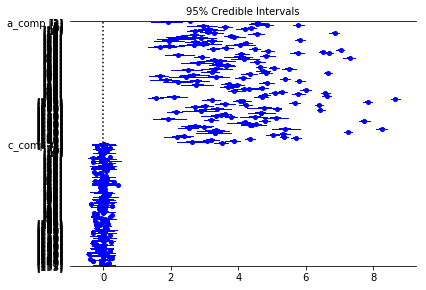

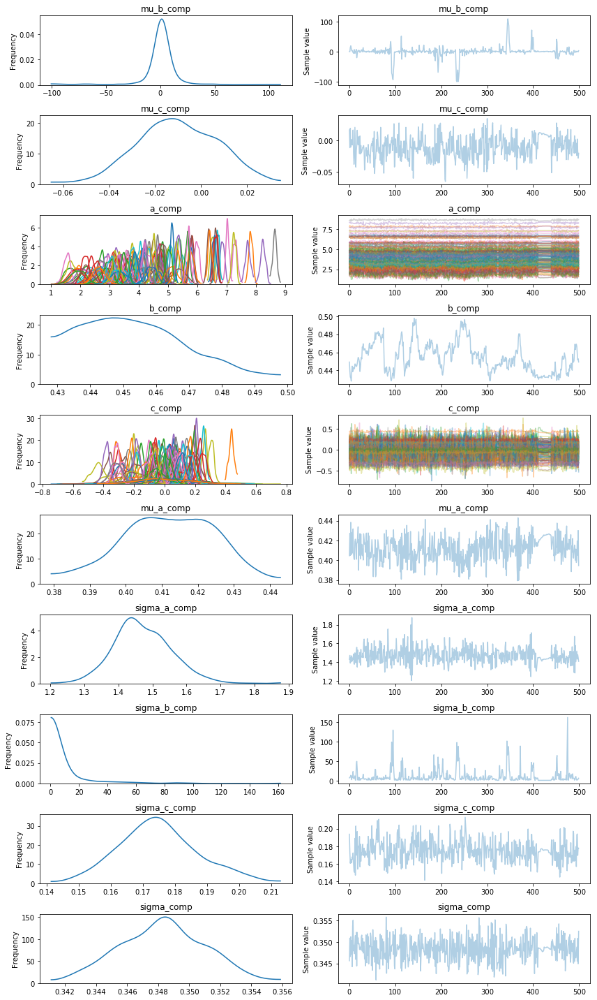

In [134]:
skater = components['skater_code'] = components.skater.replace(skater_lookup).values
skater = theano.shared(skater)
start_overall = np.asarray(components.log_overall_start)
start_overall = theano.shared(start_overall)
start_skater = np.asarray(components.log_skater_start)
start_skater = theano.shared(start_skater)

points = components.points

model = pm.Model()
with model:
    # Prior on group distribution.
    mu_a = 10 * pm.Beta('mu_a_comp', alpha=20, beta=6)
    sigma_a = pm.HalfCauchy('sigma_a_comp', 5)
    mu_b = pm.Normal('mu_b_comp', mu=0., sd=1e5)
    sigma_b = pm.HalfCauchy('sigma_b_comp', 5)
    mu_c = pm.Normal('mu_c_comp', mu=0., sd=1e5)
    sigma_c = pm.HalfCauchy('sigma_c_comp', 5)

    # Group distribution.
    a = pm.Normal('a_comp', mu_a, sd=sigma_a, shape=num_skaters)
    b = pm.Normal('b_comp', mu_b, sd=sigma_b)
    c = pm.Normal('c_comp', mu_c, sd=sigma_c, shape=num_skaters)
    sigma = pm.HalfCauchy('sigma_comp', 5)

    y_hat = a[skater] + b * start_overall + c[skater] * start_skater

    # Data model.
    y = pm.Normal('y_comp', y_hat, sd=sigma, observed=points)

# Fit the model.
with model:
    trace = pm.sample(samples=1000, tune=500)

# Save the results.
results['component'] = (trace, model, (skater, start_overall, start_skater))

# Visualize fit.
pm.forestplot(trace, varnames=['a_comp', 'c_comp'])
pm.traceplot(trace)
plt.show()

In [135]:
# Make predictions.
ppc = {}
means = {}

100%|██████████| 500/500 [00:00<00:00, 1857.58it/s]


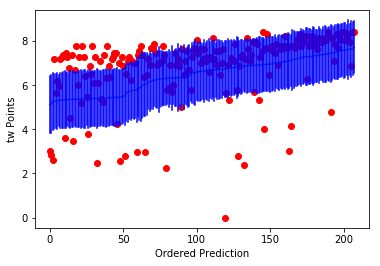

100%|██████████| 500/500 [00:00<00:00, 992.86it/s]


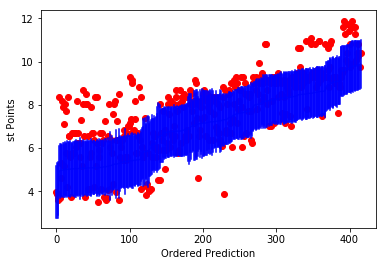

100%|██████████| 500/500 [00:00<00:00, 1083.76it/s]


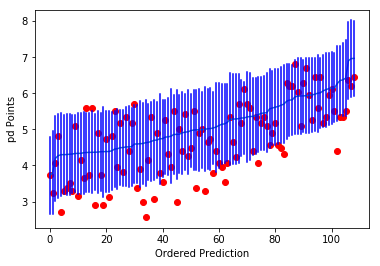

100%|██████████| 500/500 [00:00<00:00, 1686.45it/s]


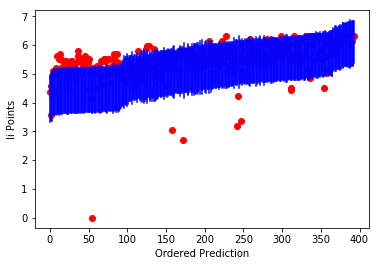

100%|██████████| 500/500 [00:00<00:00, 944.65it/s]


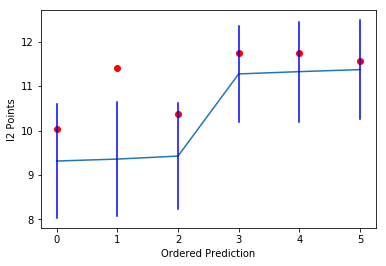

100%|██████████| 500/500 [00:00<00:00, 1121.69it/s]


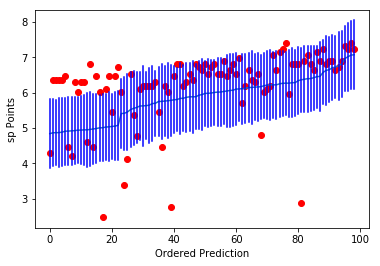

100%|██████████| 500/500 [00:00<00:00, 1077.42it/s]


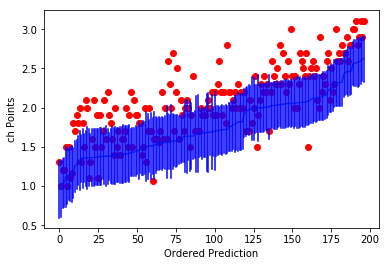

In [136]:
for elt_type in ELTS:
    elts = elements18[elements18.elt_type == elt_type]
    results[elt_type][2][0].set_value(np.asarray(elts.skater_code))
    results[elt_type][2][1].set_value(np.asarray(elts.log_overall_start))
    results[elt_type][2][2].set_value(np.asarray(elts.log_skater_start))
    
    ppc[elt_type] = pm.sample_ppc(trace=results[elt_type][0], model=results[elt_type][1], samples=500)['y_' + elt_type]

    mean = means[elt_type] = ppc[elt_type].mean(axis=0)
    std = np.std(ppc[elt_type], axis=0)
    real_outcomes = elements18[elements18.elt_type == elt_type]
    order = pd.Series(mean).sort_values().index
    outcomes = []
    for index in order:
        outcomes.append(real_outcomes.iloc[index].points)
    plt.scatter(xrange(len(mean)), outcomes, color='r')
    plt.plot(xrange(len(mean)), [mean[x] for x in order])
    for i, m, s in zip(xrange(len(mean)), mean[order], std[order]):
        plt.plot([i,i], [m-s, m+s], 'b-')
    plt.ylabel(elt_type + ' Points');plt.xlabel('Ordered Prediction');
    plt.show()

100%|██████████| 500/500 [00:00<00:00, 1184.74it/s]


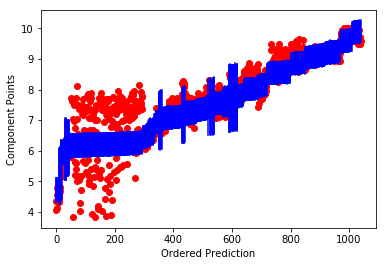

In [137]:
results['component'][2][0].set_value(np.asarray(components18.skater_code))
results['component'][2][1].set_value(np.asarray(components18.log_overall_start))
results['component'][2][2].set_value(np.asarray(components18.log_skater_start))

ppc_result = pm.sample_ppc(trace=results['component'][0], model=results['component'][1], samples=500)
ppc['component'] = ppc_result['y_comp']

mean = means['component'] = ppc['component'].mean(axis=0)
std = np.std(ppc['component'], axis=0)

# Sort actual point outcomes by order predicted by model.
real_outcomes = components18
order = pd.Series(mean).sort_values().index
outcomes = []
for index in order:
    outcomes.append(real_outcomes.iloc[index].points)
plt.scatter(xrange(len(mean)), outcomes, color='r')
plt.plot(xrange(len(mean)), [mean[x] for x in order])
for i, m, s in zip(xrange(len(mean)), mean[order], std[order]):
    plt.plot([i,i], [m-s, m+s], 'b-')
plt.ylabel('Component Points');plt.xlabel('Ordered Prediction');
plt.show()

In [138]:
elt_pred_col = []
elt_indices = {elt_type: 0 for elt_type in ELTS}
for index, row in elements18.iterrows():
    elt_pred_col.append(means[row.elt_type][elt_indices[row.elt_type]])
    elt_indices[row.elt_type] += 1

In [142]:
elements18['prediction'] = elt_pred_col
components18['prediction'] = means['component']
components18.rename(columns={'comp_type': 'elt_type'}, inplace=True)
elements18['is_elt'] = pd.Series([1] * len(elt_pred_col))
components18['is_elt'] = pd.Series([0] * len(comp_pred_col))

In [143]:
prediction = pd.concat([elements18, components18])
prediction.to_csv('fits/dance_predictions3.csv')